# Gráficas: Condiciones atmosféricas propensas para Ondas de Montaña

### Nota: las horas están en formato GMT, tenemos que restarle 6 hrs para que sea la hora real en la CDMX.

#### GMT-6: México (hora centro), Costa Rica, El Salvador, Guatemala, Honduras, Nicaragua.

In [1]:
# cargar las bibliotecas que usaremos

import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import numpy as np
import xarray as xr
from netCDF4 import Dataset
import cartopy.crs as crs
from cartopy.feature import NaturalEarthFeature
from matplotlib.cm import get_cmap
from wrf import to_np, getvar, CoordPair, vertcross, interpline
import wrf
import metpy.calc as mpcalc
from metpy.plots import SkewT
from metpy.units import units

import warnings
warnings.filterwarnings('ignore')

In [2]:
# un archivo del output de modelo wrf
filename = 'wrfout_d02_2021-12-19_00.nc'
wrfin=Dataset(filename)

# cargar DataFrame con xarray
ds = xr.open_dataset(filename)

In [3]:
def unstagger(ugrid, vgrid):
    """ Interpolate u and v component values to values at grid cell centres (from D.Latornell for NEMO output).
    The shapes of the returned arrays are 1 less than those of
    the input arrays in the y and x dimensions.
    :arg ugrid: u velocity component values with axes (..., y, x)
    :type ugrid: :py:class:`numpy.ndarray`
    :arg vgrid: v velocity component values with axes (..., y, x)
    :type vgrid: :py:class:`numpy.ndarray`
    :returns u, v: u and v component values at grid cell centres
    :rtype: 2-tuple of :py:class:`numpy.ndarray`
    """
    u = np.add(ugrid[..., :-1], ugrid[..., 1:]) / 2
    v = np.add(vgrid[..., :-1, :], vgrid[..., 1:, :]) / 2
    return u, v

In [4]:
#Tiempo
t = 20
t_cdmx = t - 6 # t es la hora en CDMX

#altura
k=5

#Coordenadas del valle de méxico
lat1 = 18.8
lat2 = 20.0
lon1 = -99.6
lon2 = -98.4

x_y_1 = wrf.ll_to_xy(wrfin, lat1, lon1).data
x_y_2 = wrf.ll_to_xy(wrfin, lat2, lon2).data

Long=ds.XLONG[t,x_y_1[1]:x_y_2[1],x_y_1[0]:x_y_2[0]]
Lat=ds.XLAT[t,x_y_1[1]:x_y_2[1],x_y_1[0]:x_y_2[0]]

#Velocidad meridional y zonal
u0 = ds.U[t,k,:,:]#tiempo, altura
v0 = ds.V[t,k,:,:]
U0,V0 = unstagger(u0,v0)

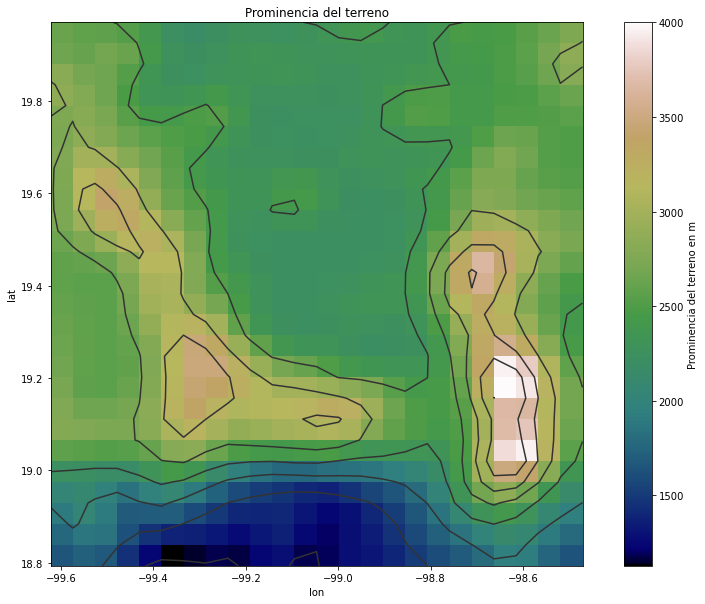

In [5]:
fig, ax = plt.subplots(1,1, figsize=(15,10))
Hgt=ds.HGT[t,x_y_1[1]:x_y_2[1],x_y_1[0]:x_y_2[0]]
pc = ax.pcolormesh(Long, Lat, Hgt,cmap = 'gist_earth')
plt.colorbar(pc, label='Prominencia del terreno en m')

cn = ax.contour(Long,Lat, Hgt, colors='0.2')

#ax.set_xlim(-99.6, -98.4)
#ax.set_ylim(18.8, 20)
ax.set_xlabel('lon')
ax.set_ylabel('lat')
ax.set_title('Prominencia del terreno')
ax.set_aspect(1)

In [6]:
#Limites
#Coordenadas del valle de méxico
lat1 = 18.92992
lat2 = 19.969967
lon1 = -99.62255
lon2 = -98.42362

x_y_1 = wrf.ll_to_xy(wrfin, lat1, lon1).data
x_y_2 = wrf.ll_to_xy(wrfin, lat2, lon2).data

ilat_1 = x_y_1[1]#95'''Esto es para las coordenadas de arriba, si se modifican'''
ilat_2 = x_y_2[1]#119'''entonces ya no son estos indices'''
ilon_1 = x_y_1[0]#136
ilon_2 = x_y_2[0]#162

Long=ds.XLONG[t,x_y_1[1]:x_y_2[1],x_y_1[0]:x_y_2[0]]
Lat=ds.XLAT[t,x_y_1[1]:x_y_2[1],x_y_1[0]:x_y_2[0]]



#long = ds.XLONG[t,95:119,136:162] #Abarca desde -99.62255 al -98.42362 
#lat = ds.XLAT[t,95:119,136:162] #abarca desde 18.92992 al 19.969967

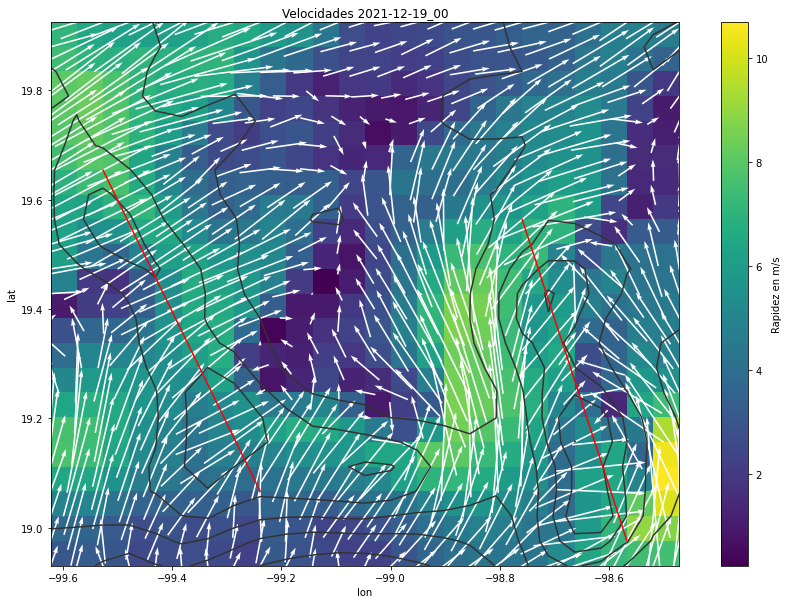

In [7]:
fig, ax = plt.subplots(1,1, figsize=(15,10))
spd = np.sqrt(U0[ilat_1:ilat_2,ilon_1:ilon_2].data**2+V0[ilat_1:ilat_2,ilon_1:ilon_2].data**2)
pc = ax.pcolormesh(Long,Lat,spd[:,:],cmap = 'viridis') # Si se le agrega un _r al cmap lo pone en reversa
plt.colorbar(pc, label='Rapidez en m/s')
cn = ax.contour(Long,Lat,ds.HGT[t,ilat_1:ilat_2,ilon_1:ilon_2], colors='0.2')

#LINEAS PARA REPRESENTAR LAS COORDILLERAS (EL POLLO)
linex=np.linspace(ds.XLONG[0,97,154],ds.XLONG[0,97,158],10)
liney=np.linspace(ds.XLAT[0,109,154],ds.XLAT[0,96,154],10)
linex2=np.linspace(ds.XLONG[0,97,138],ds.XLONG[0,97,144],10)
liney2=np.linspace(ds.XLAT[0,111,140],ds.XLAT[0,98,140],10)
plt.plot(linex,liney, color='red')
plt.plot(linex2,liney2, color='red')

ax.quiver(Long,Lat,U0[ilat_1:ilat_2,ilon_1:ilon_2],V0[ilat_1:ilat_2,ilon_1:ilon_2],scale=45,color='w',pivot='mid')
ax.set_xlabel('lon')
ax.set_ylabel('lat')
ax.set_title('Velocidades %s'%filename[11:-3])
ax.set_aspect(1)

## Rotación del sistema 

In [8]:
#ángulo obtenido en papel pero 100% veridico
# Matriz de Rotación Inversa

theta = np.deg2rad(25)
R_inv = np.array([[np.cos(theta), np.sin(theta)],
                  [-np.sin(theta), np.cos(theta)]])

#print(R_inv)
#Recordemos que aquí ya  hay un tiempo y un nivel k especifico

# Vectores de entrada (sistema no rotado)
u0 = U0[ilat_1:ilat_2,ilon_1:ilon_2]
v0 = V0[ilat_1:ilat_2,ilon_1:ilon_2]
u0_p=np.empty((23,25))
v0_p=np.empty((23,25))
for i in range(23):#latitud
    for j in range(25):#long
        c1 = u0[i,j]
        c2 = v0[i,j]
        
        u0_p[i,j] = np.cos(theta)*c1+np.sin(theta)*c2
        v0_p[i,j] = -np.sin(theta)*c1+ np.cos(theta)*c2
             
        #vectores en el sistema rotado
       
        #print(u0_p.data)

Text(0.5, 1.0, 'Altura de los niveles verticales -98.567497 N 2021-12-19_00')

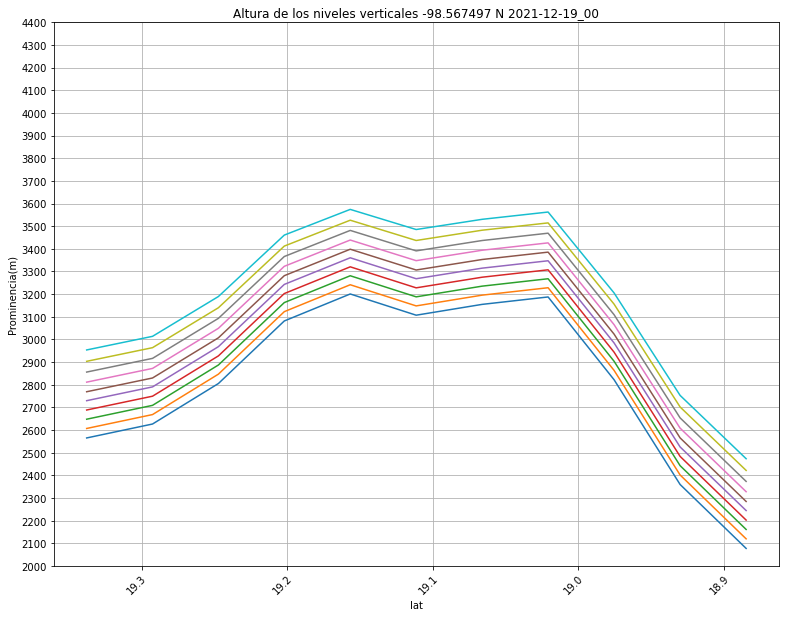

In [9]:
# CORTE TRANSVERSAL A LO LARGO DE VARIAS LATITUDES CON LON FIJA
#Seleccionamos una longitud
lon_popo=-98.5816
lat_popo=[18.9, 19.4] 
popo1 = wrf.ll_to_xy(wrfin, lat_popo[0], lon_popo).data
popo2 = wrf.ll_to_xy(wrfin, lat_popo[1], lon_popo).data
# Sin staggering, la prominencia a partir del nivel 0 es:
hght_ph_phb = (ds.PH[0,...]+ds.PHB[0,...])/9.81


fig, ax = plt.subplots(1,1, figsize=(13,10))
#ax2=ax.twinx()
for level in range(10):
    #p=ds.PB[t,level,93:115,ilon]
    ax.plot(ds.XLAT[t,popo1[1]:popo2[1],popo1[0]],hght_ph_phb[level,popo1[1]:popo2[1],popo1[0]])
    #ax2.plot(ds.XLAT[t,93:115,ilon],p/100,color='gray')
   
    
ax.invert_xaxis()
#ax2.invert_yaxis()
ax.set_yticks(range(2000, 4500, 100))
#ax.set_xticks(np.arange(19.8, 18.8, -0.05))
#ax2.set_yticks(np.arange(2000, 1650, -50))
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
ax.set_xlabel('lat')
ax.set_ylabel('Prominencia(m)')
ax.grid(True)
ax.set_title('Altura de los niveles verticales %f N %s'%(ds.XLONG[0,0,popo1[0]], filename[11:-3]))

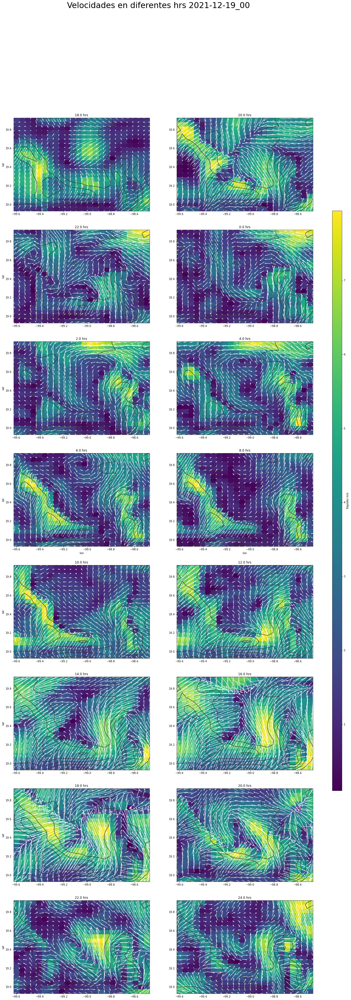

In [10]:
t=0
k=5
#Coordenadas del valle de méxico
lat1 = 18.92992
lat2 = 19.969967
lon1 = -99.62255
lon2 = -98.42362

x_y_1 = wrf.ll_to_xy(wrfin, lat1, lon1).data
x_y_2 = wrf.ll_to_xy(wrfin, lat2, lon2).data

ilat_1 = x_y_1[1]#95'''Esto es para las coordenadas de arriba, si se modifican'''
ilat_2 = x_y_2[1]#119'''entonces ya no son estos indices'''
ilon_1 = x_y_1[0]#136
ilon_2 = x_y_2[0]#162

long=ds.XLONG[t,x_y_1[1]:x_y_2[1],x_y_1[0]:x_y_2[0]]
lat=ds.XLAT[t,x_y_1[1]:x_y_2[1],x_y_1[0]:x_y_2[0]]

fig, ax= plt.subplots(8,2, figsize=(20,60))
fig.suptitle('Velocidades en diferentes hrs %s'%filename[11:-3],fontsize=30)

for i in range(8):
    for j in range(2):
        t_cdmx = t - 6
        u0 =ds.U[t,k,:,:]#tiempo, altura
        v0 = ds.V[t,k,:,:]
        U0,V0 = unstagger(u0,v0)
        spd = np.sqrt(U0[ilat_1:ilat_2,ilon_1:ilon_2].data**2+V0[ilat_1:ilat_2,ilon_1:ilon_2].data**2)
        pc = ax[i,j].pcolormesh(long,lat,spd[:,:],cmap = 'viridis') # Si se le agrega un _r al cmap lo pone en reversa
        
        cn = ax[i,j].contour(long,lat,ds.HGT[t,ilat_1:ilat_2,ilon_1:ilon_2],colors='0.2')
        ax[i,j].quiver(long,lat,U0[ilat_1:ilat_2,ilon_1:ilon_2],V0[ilat_1:ilat_2,ilon_1:ilon_2],scale=45,color='w',pivot='mid')
        ax[3,j].set_xlabel('lon')
        ax[i,0].set_ylabel('lat')
        if t_cdmx < 0:
            t_cdmx = t_cdmx+24
        ax[i,j].set_title('%1.1f hrs' %t_cdmx)
        t=t+2
        #ax.set_aspect(1)   
cax = plt.axes([0.95, 0.30, 0.025, 0.5])
plt.colorbar(pc, label='Rapidez m/s',cax=cax)
            


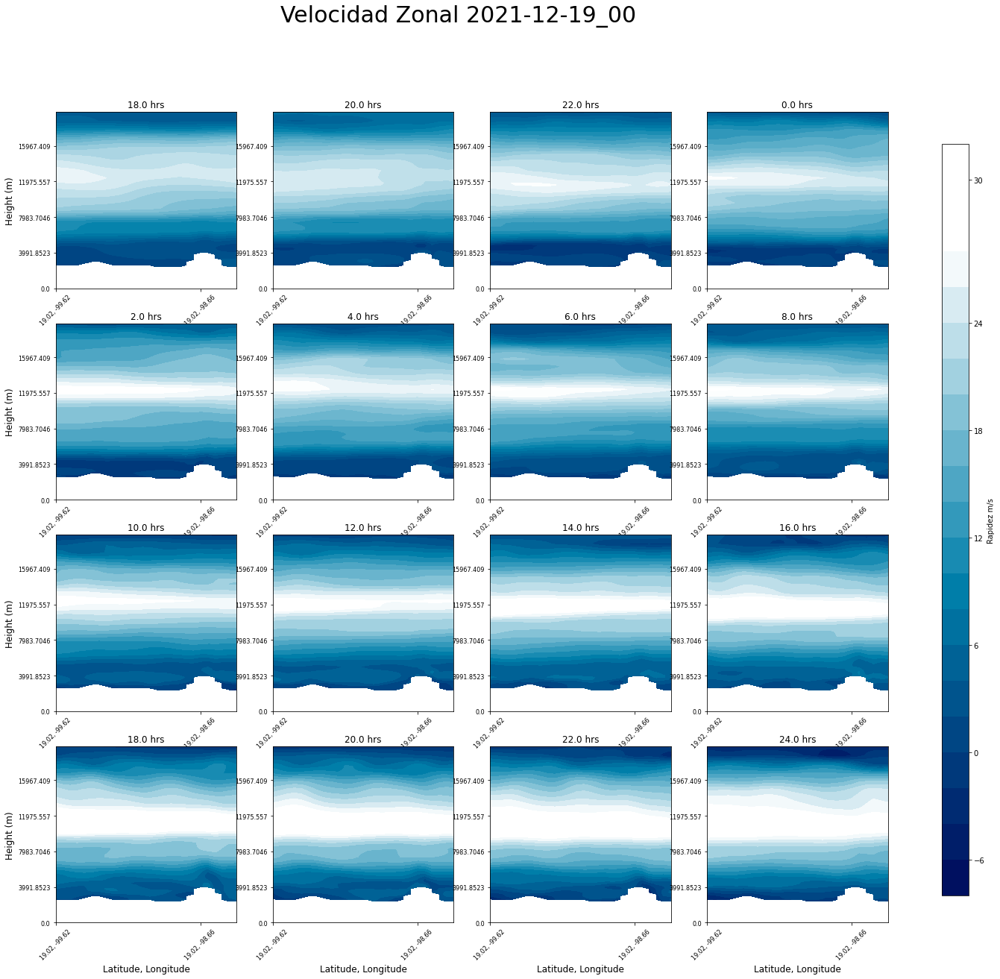

In [11]:
# Abrir archivo NetCDF (pueden hacer algo similar usando xarray si lo prefieren)

ncfile = Dataset(filename)
fig, ax= plt.subplots(4,4, figsize=(20,20))
fig.suptitle('Velocidad Zonal %s'%filename[11:-3],fontsize=30)

#Tiempo
t = 0


for i in range(4):
    for j in range(4):
        t_cdmx = t - 6
        # Extrae altura del modelo y velocidad del viento
        z = getvar(ncfile, "z")
        wspd =  getvar(ncfile, "ua", timeidx=t, units='m s-1')

        # Crea el punto de partida y de término para la sección transversal
        start_point = CoordPair(lat=19.02, lon=-99.6)
        end_point = CoordPair(lat=19.02, lon=-98.4)

        # Computa la interpolación de la sección transversal. También,
        # incluye los puntos lat.lon a lo largo de la sección.
        wspd_cross = vertcross(wspd, z, wrfin=ncfile, start_point=start_point,
                           end_point=end_point, latlon=True, meta=True)


        # Contour plot
        wspd_contours = ax[i,j].contourf(to_np(wspd_cross),20, norm=TwoSlopeNorm(0.0), cmap='ocean', vmin=-28,vmax=28)
    #agregar contorno cuando la vel=0
       
        # Define los x-ticks para usar en latitud y longitud
        coord_pairs = to_np(wspd_cross.coords["xy_loc"])
        x_ticks = np.arange(coord_pairs.shape[0])
        x_labels = [pair.latlon_str(fmt="{:.2f}, {:.2f}")
                for pair in to_np(coord_pairs)]
        ax[i,j].set_xticks(x_ticks[::20])
        ax[i,j].set_xticklabels(x_labels[::20], rotation=45, fontsize=8)

        # Define y-ticks para que sean alturas
        vert_vals = to_np(wspd_cross.coords["vertical"])
        v_ticks = np.arange(vert_vals.shape[0])
        ax[i,j].set_yticks(v_ticks[::20])
        ax[i,j].set_yticklabels(vert_vals[::20], fontsize=8)

        # Define las etiquetas del eje x y y
        ax[3,j].set_xlabel("Latitude, Longitude", fontsize=12)
        ax[i,0].set_ylabel("Height (m)", fontsize=12)
        
        if t_cdmx < 0:
            t_cdmx = t_cdmx+24
        ax[i,j].set_title('%1.1f hrs' %t_cdmx)
        t=t+2
 # Agrega la barra de color
cax = plt.axes([0.95, 0.15, 0.025, 0.7])
plt.colorbar(wspd_contours, label='Rapidez m/s',cax=cax)


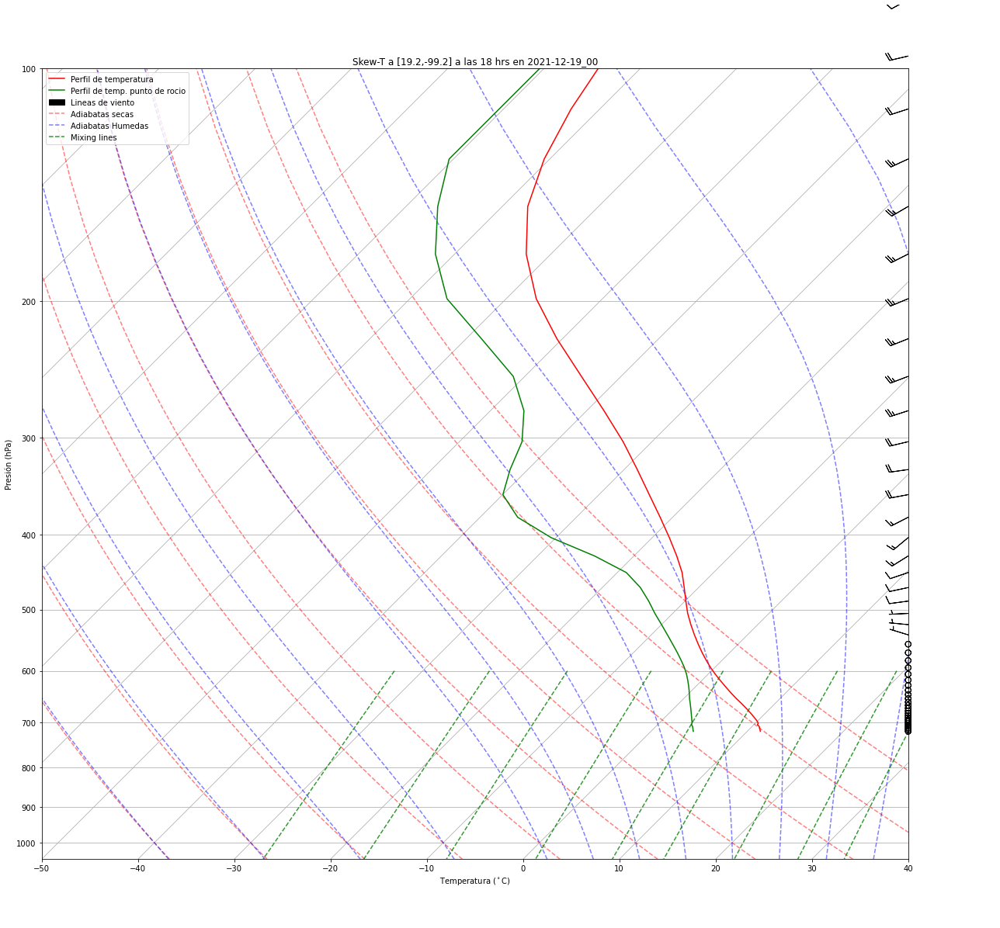

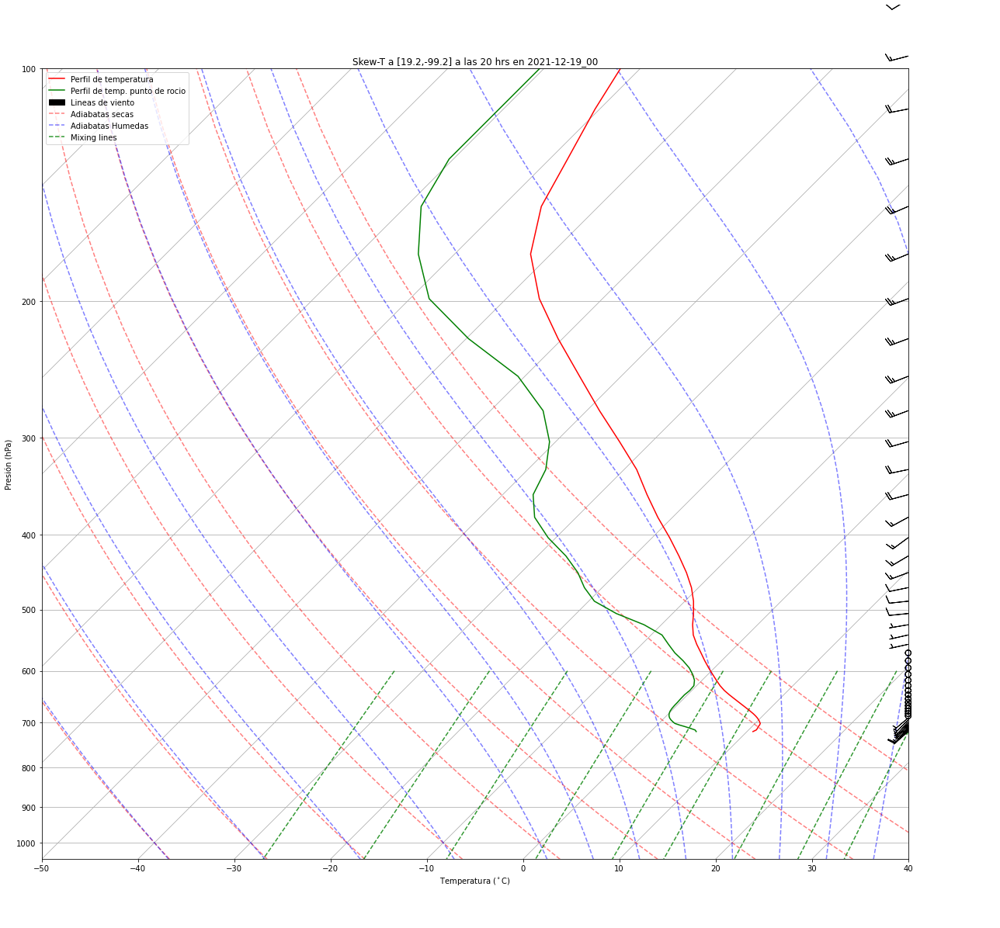

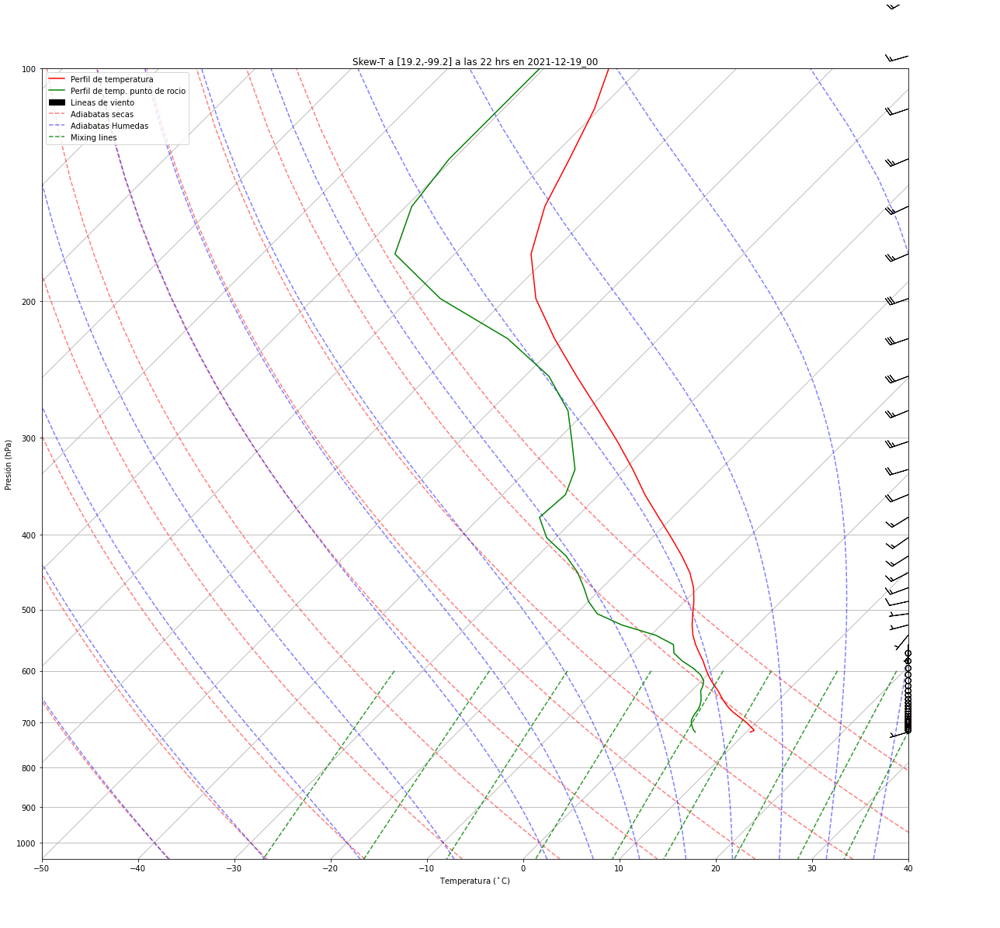

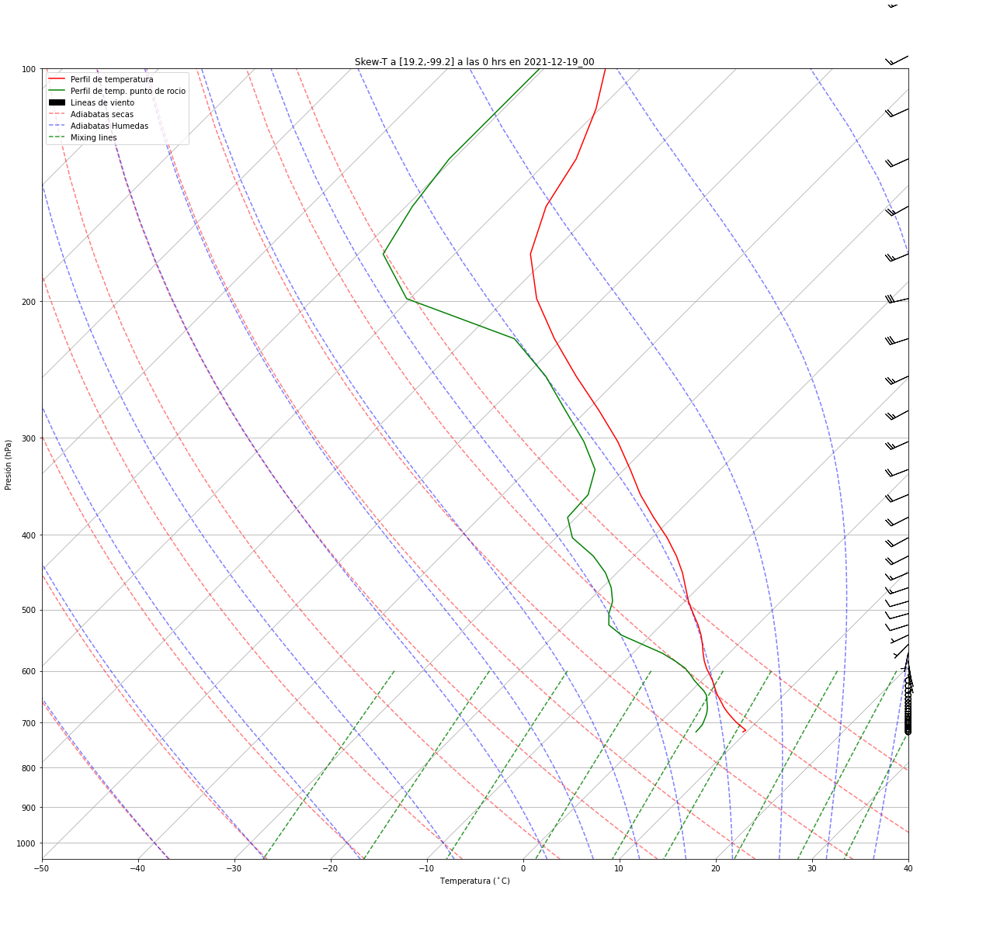

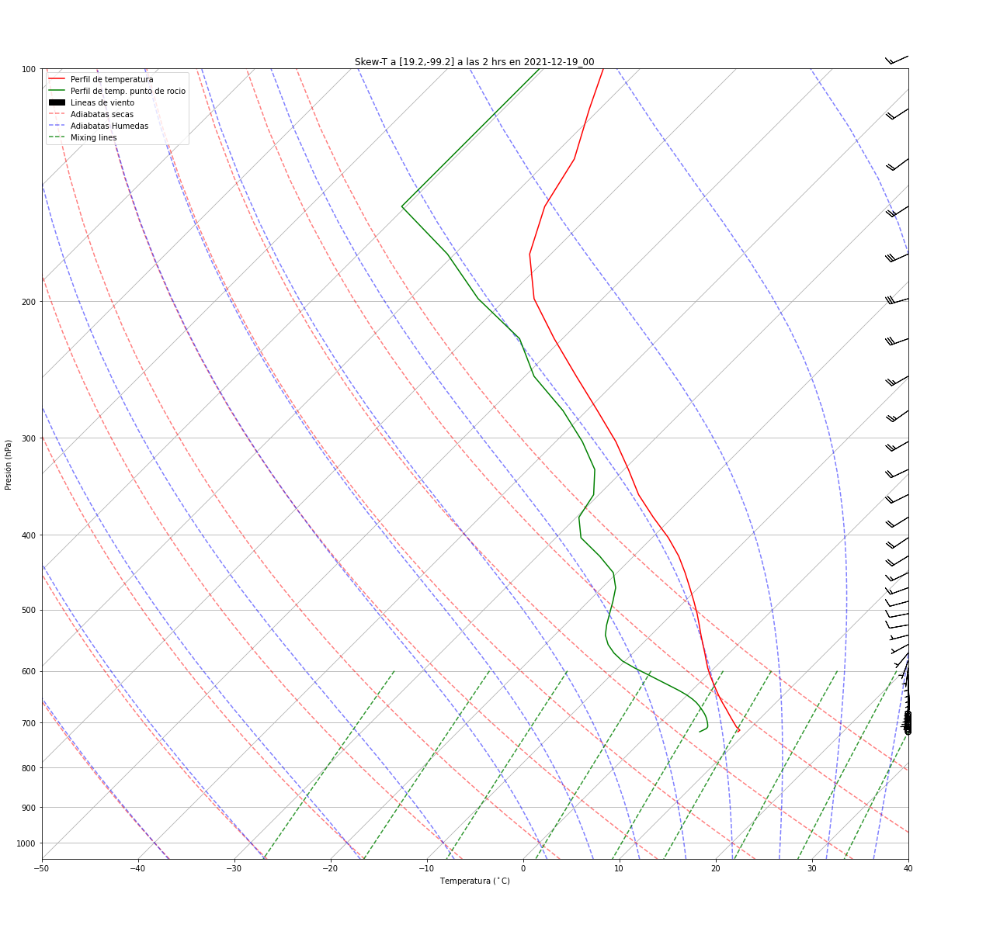

...

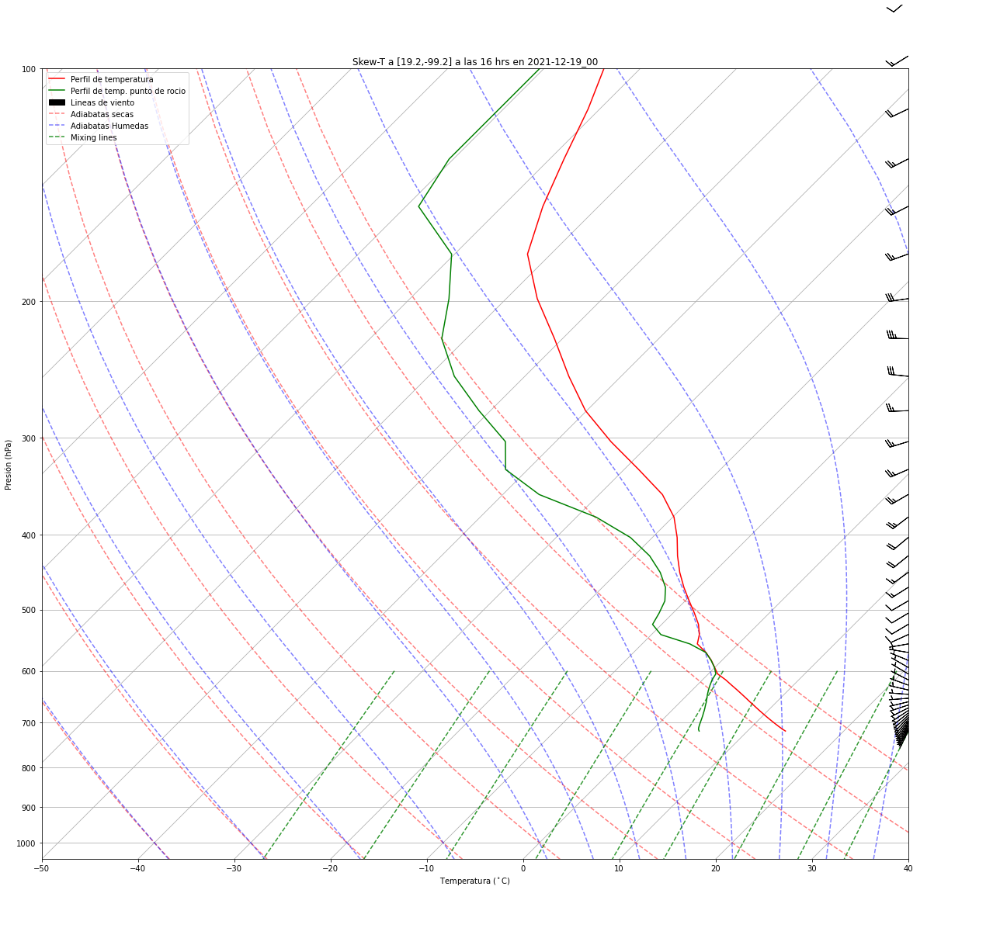

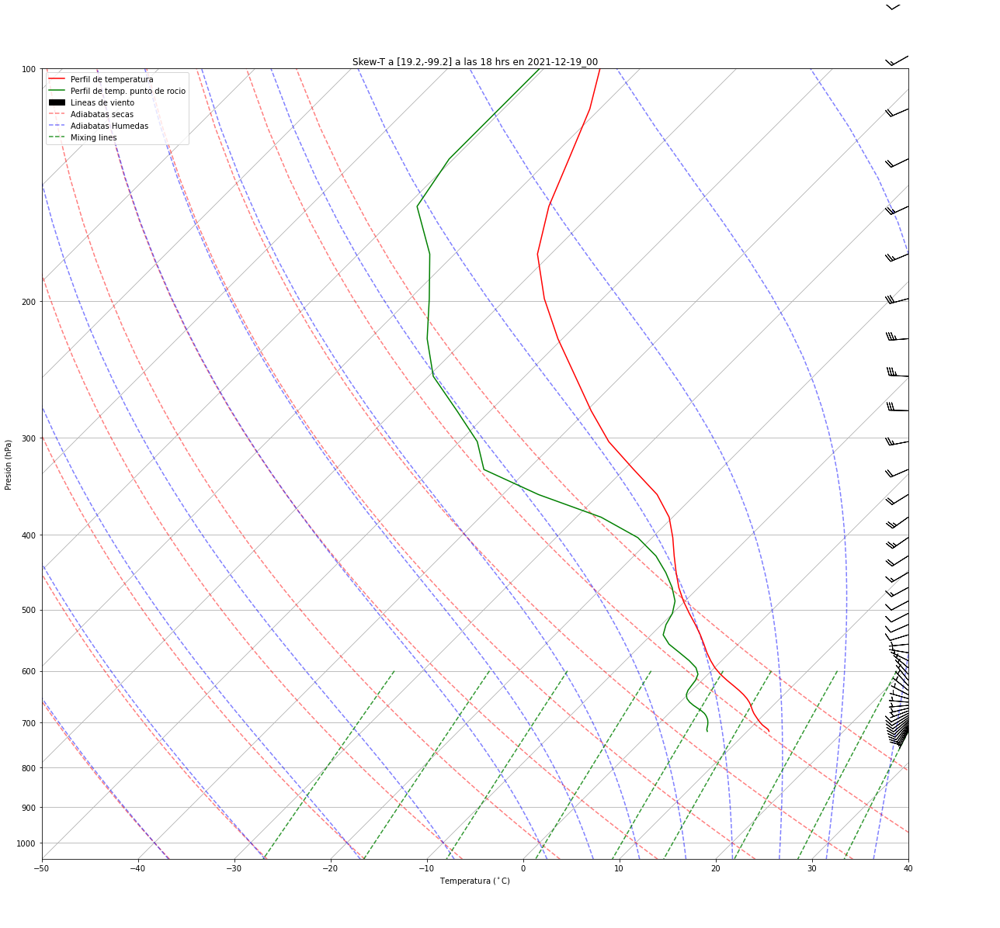

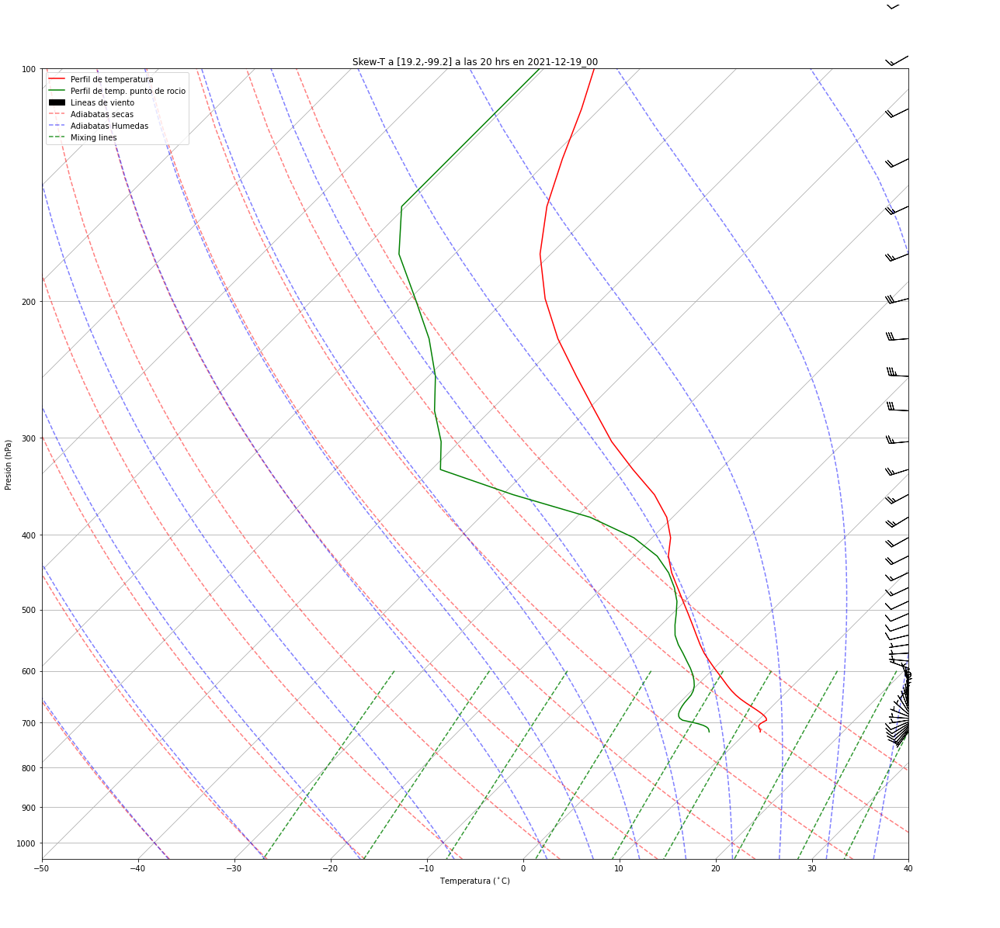

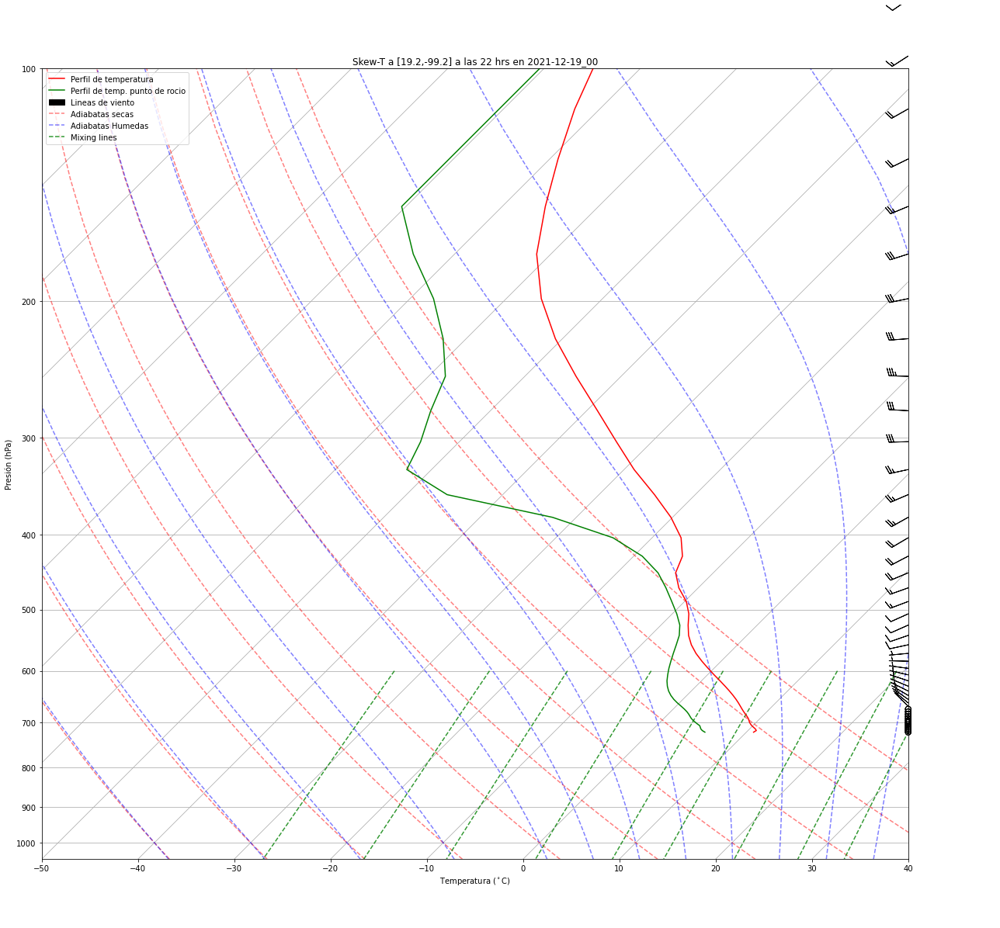

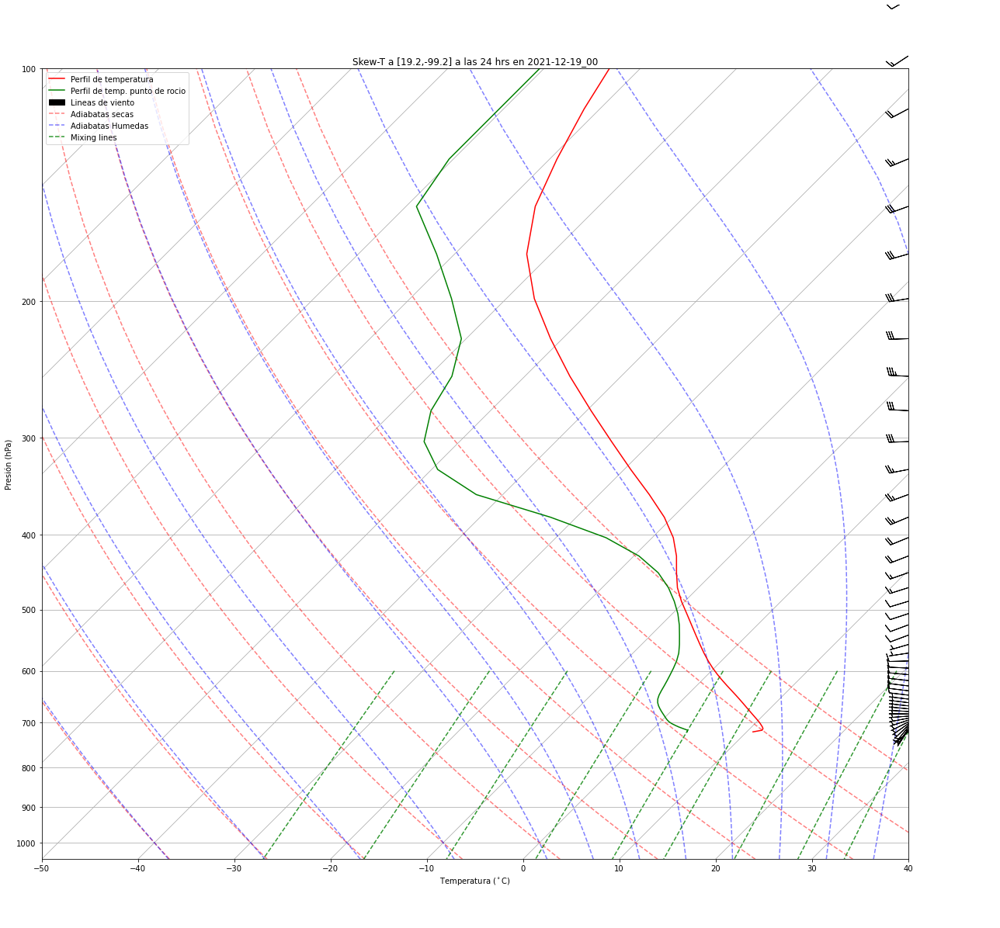

In [12]:
#Coordenadas a utilizar dónde solo cambiaremos las latitudes
lat= 19.2
lon = -99.2

#El primer for correra las horas

for k in range(0,31,2):
    t_cdmx=k-6
    wrfin = Dataset(filename)
    #Este comando cambia nuestras coordenas de lat y long a los indices más cercanos al valor deseado
    x_y = wrf.ll_to_xy(wrfin, lat, lon)

    #PRESIÓN
    p1=wrf.getvar(wrfin,"pressure",timeidx=k)
    #Aquí se toman los calores para todos niveles de altitud pero solo para la coordenada deseada.
    #NOTA: 
    #Por alguna razón wrf.ll_to_xy invierte los indices (de lat, lon a lon, lat), es por eso que tomamos
    #el indice 1 para latitud y 0 para longitud
    p = p1[:,x_y[1],x_y[0]]

    #TEMPERATURA EN CELSIUS
    tc1=wrf.getvar(wrfin,"tc",timeidx=k,meta=False)
    tc = tc1[:,x_y[1],x_y[0]]
        

    #TEMPERATURA PUNTO DE ROCIO
    td1=wrf.getvar(wrfin,"td",timeidx=k,meta=False)
    td = td1[:,x_y[1],x_y[0]]
      

    #COMPONENTE U DE LA VELOCIDAD
    ua1=wrf.getvar(wrfin,"ua",timeidx=k,meta=False)
    ua = ua1[:,x_y[1],x_y[0]]
     

    #COMPONENTE V DE LA VELOCIDAD
    va1=wrf.getvar(wrfin,"va",timeidx=k,meta=False)
    va = va1[:,x_y[1],x_y[0]]
        
    fig = plt.figure(figsize=(20,20 ))
    skew = SkewT(fig, rotation=45)
    #Perfil de temperatura
    P_t = skew.plot(p, tc, 'r')
    #perfil de temperatura del punto de rocio
    P_procio = skew.plot(p, td, 'g')
    #rapidez y dirección del viento
    wb=skew.plot_barbs(p, ua, va)

    #Graficamos la lineas de adiabatas secas
    da=skew.plot_dry_adiabats()
    #adiabatas humedas
    ma=skew.plot_moist_adiabats()
        
    #mixig lines se refiere a la proporción de mezcla de aire seco con aire humedo
    #En grafica de radio sondeo, la relación de mezcla en cualquier nivel dado es 
    #la cantidad de vapor de agua en el aire donde la línea de temperatura del punto de rocío 
    #cruza la mixing line.
    ml=skew.plot_mixing_lines()
        
    skew.ax.legend([P_t,P_procio,wb,da,ma,ml],
                  labels=['Perfil de temperatura','Perfil de temp. punto de rocio','Lineas de viento',
                               'Adiabatas secas','Adiabatas Humedas','Mixing lines'], loc='upper left' )
    if t_cdmx < 0:
            t_cdmx = t_cdmx+24
    skew.ax.set_title('Skew-T a [%s,%s] a las %s hrs en %s'%(lat, lon,t_cdmx, filename[11:-3]))
    #Rango de temperaturas
    skew.ax.set_xlim(-50, 40)
    skew.ax.set_xlabel('Temperatura ($^\circ$C)')
    skew.ax.set_ylabel('Presión (hPa)')
        
    #Comando opciónal en caso de querer guardar las gráficas
    #plt.savefig('SkewT_(%s,%s)_%s_hrs.png'%(lat, lon ,k))


# Comparación de alturas

Text(0.5, 1.0, 'Prominencia calculada con ds.HGT -98.567497 N2021-12-19_00')

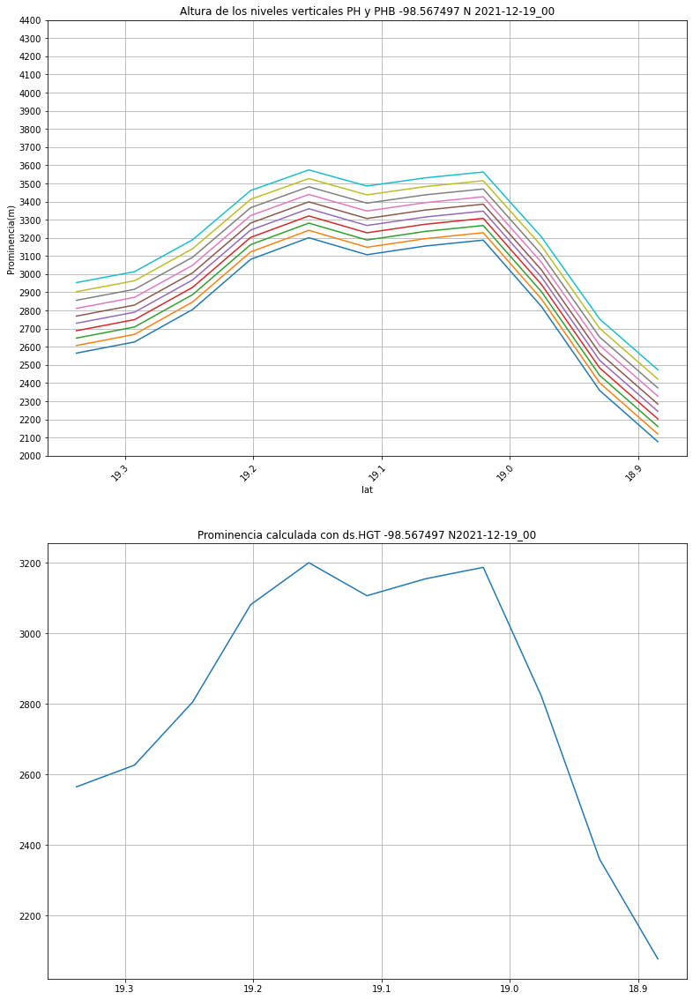

In [13]:
# CORTE TRANSVERSAL A LO LARGO DE VARIAS LATITUDES CON LON FIJA
#Seleccionamos una longitud
lon_popo=-98.5816
lat_popo=[18.9, 19.4] 
popo1 = wrf.ll_to_xy(wrfin, lat_popo[0], lon_popo).data
popo2 = wrf.ll_to_xy(wrfin, lat_popo[1], lon_popo).data
# Sin staggering, la prominencia a partir del nivel 0 es:
hght_ph_phb = (ds.PH[0,...]+ds.PHB[0,...])/9.81
#Aquí cada variable SÍ CAMBIA UN POQUitooooo con el tiempo pero
#sumadas ya no jajaja, por eso dejamos t=0

fig, axs = plt.subplots(2, figsize=(13,20))
for level in range(10):
    axs[0].plot(ds.XLAT[t,popo1[1]:popo2[1],popo1[0]],hght_ph_phb[level,popo1[1]:popo2[1],popo1[0]])
axs[1].plot(ds.XLAT[t,popo1[1]:popo2[1],popo1[0]],ds.HGT[t,popo1[1]:popo2[1],popo1[0]])       
axs[0].invert_xaxis()
axs[1].invert_xaxis()
axs[0].set_yticks(range(2000, 4500, 100))
plt.setp(axs[0].get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
axs[0].set_xlabel('lat')
axs[0].set_ylabel('Prominencia(m)')
axs[0].grid(True)
axs[1].grid(True)
axs[0].set_title('Altura de los niveles verticales PH y PHB %f N %s' %(ds.XLONG[0,0,popo1[0]], filename[11:-3]))
axs[1].set_title('Prominencia calculada con ds.HGT %f N%s'%(ds.XLONG[0,0,popo1[0]],filename[11:-3]))

Conclusión:

Las alturas calculadas con phb y ph, sirven bien para demostrar las alturas de los niveles de altitud "top_bottom"

# Ubicando puntos más altos popo

In [14]:
#Tiempo
t = 20

lat1 = 19.0
lat2 = 19.5
lon1 = -99.8
lon2 = -98.4

x_y_1 = wrf.ll_to_xy(wrfin, lat1, lon1).data
x_y_2 = wrf.ll_to_xy(wrfin, lat2, lon2).data

ilat_1 = x_y_1[1]
ilat_2 = x_y_2[1]
ilon_1 = x_y_1[0]
ilon_2 = x_y_2[0]

altm_popo=[]
latm_popo=[]
lonm_popo=[]

for i in range(ilat_1,ilat_2):#lat
    for j in range(ilon_1,ilon_2):#lon
        if ds.HGT[t,i,j]>3200:
            altm_popo.append(ds.HGT[t,i,j])
            latm_popo.append(ds.XLAT[t,i,j])
            lonm_popo.append(ds.XLONG[t,i,j])
            
altm_popo = np.array(altm_popo)
latm_popo = np.array(latm_popo)
lonm_popo = np.array(lonm_popo)

In [15]:
altm_popo

array([3868.581 , 3958.7812, 3442.63  , 3633.8047, 3408.1836, 3681.6982,
       3753.35  , 3672.7563, 3939.0898, 3629.2036, 3375.585 , 3202.0522,
       3262.0425, 3231.7822, 3672.413 , 3648.4783, 3480.9788, 3591.626 ,
       3356.0898, 3430.997 , 3374.5667, 3238.6948, 3243.6785, 4001.2632,
       3912.4136, 3200.5981, 3211.6426, 3480.7166, 3478.6665, 3226.044 ,
       3365.892 , 3966.9854, 3782.6182, 3466.2646, 3325.111 , 3327.6326,
       3559.5972, 3290.107 , 3201.442 , 3251.5347, 3208.9382, 3333.0894,
       3331.734 , 3583.4084, 3253.5706, 3305.7483, 3648.5034, 3426.0244,
       3234.0845, 3327.0166, 3304.8386], dtype=float32)

# Ajusco y Marquesa

In [16]:
lat1 = 19.06
lat2 = 19.6
lon1 = -99.5
lon2 = -99.23

x_y_1 = wrf.ll_to_xy(wrfin, lat1, lon1).data
x_y_2 = wrf.ll_to_xy(wrfin, lat2, lon2).data

ilat_1 = x_y_1[1]
ilat_2 = x_y_2[1]
ilon_1 = x_y_1[0]
ilon_2 = x_y_2[0]

altm_aju=[]
latm_aju=[]
lonm_aju=[]
ilatm_aju=[]
ilonm_aju=[]

for i in range(ilat_1,ilat_2):#lat
    for j in range(ilon_1,ilon_2):#lon
        if ds.HGT[t,i,j]>3200:
            altm_aju.append(ds.HGT[t,i,j])
            latm_aju.append(ds.XLAT[t,i,j])
            lonm_aju.append(ds.XLONG[t,i,j])
            ilatm_aju.append(i)
            ilonm_aju.append(j)
            
altm_aju = np.array(altm_aju)
latm_aju = np.array(latm_aju)
lonm_aju = np.array(lonm_aju)
ilatm_aju = np.array(ilatm_aju)
ilonm_aju = np.array(ilonm_aju)
#np.savez('alt_max_ajumar',np.array(altm_aju),np.array(latm_aju),np.array(lonm_aju))

In [17]:
ilatm_aju, ilonm_aju

(array([ 99,  99, 100, 100, 101, 101, 102, 102, 103, 107, 108, 109]),
 array([142, 143, 142, 143, 142, 143, 142, 143, 142, 140, 139, 139]))

In [18]:
latm_aju, lonm_aju

(array([19.111267, 19.111267, 19.15657 , 19.15657 , 19.201874, 19.201874,
        19.247147, 19.247147, 19.29242 , 19.473381, 19.518578, 19.563782],
       dtype=float32),
 array([-99.33481 , -99.28685 , -99.33481 , -99.28685 , -99.33481 ,
        -99.28685 , -99.33481 , -99.28685 , -99.33481 , -99.430725,
        -99.47868 , -99.47868 ], dtype=float32))

# REGLA 1.6
'''Es útil recordar esta regla empírica general que llamamos la «regla de 1,6»: 
si la velocidad del viento a 2000 m de altura sobre el nivel de la cima de 
la cresta es más de 1,6 veces la velocidad del viento en la cima de la cresta, 
cabe esperar la presencia de un régimen de ondas de sotavento atrapadas.'''


## Ajusco y Marquesa (INCOMPLETO)

In [19]:
#Coordenadas
lon_aju=[-99.5,-99.23]
lat_aju=[19.06, 19.6] 
aju1 = wrf.ll_to_xy(wrfin, lat_aju[0], lon_aju[0]).data
aju2 = wrf.ll_to_xy(wrfin, lat_aju[1], lon_aju[1]).data

ilat_1 = aju1[1]
ilat_2 = aju2[1]
ilon_1 = aju1[0]
ilon_2 = aju2[0]
#Creamos un arreglo vacio tanto para la velocidad como para la altura
hgt = np.empty((25,12,5)) #nivel vert, no. datos
u0_aju = np.empty((2,25,12,5)) #nivel vert, hora, no. datos

#Definición de la velocidad
#aquí recordemos que solo necesitamos ocupar la componente u0 que es perpendicular a nuestra coordillera
        
        
for k in range(25):#niveles de alt
    for i in range(12):
        i=ilat_1+i
        #DEFINICÓN DE LA ALTURA
        alt=hght_ph_phb[k,i,ilon_1:ilon_2].data
        i=i-ilat_1
        hgt[k,i,:]=alt


#Velocidades, nivel k=0
for t in np.arange(0,25,1):#tiempo
    for i in range(12):#Latitud
        for j in range(5):#longitud
            i=i+ilat_1
            j=j+ilon_1
            u0 = ds.U[t,0,:,:]#tiempo, altura
            v0 = ds.V[t,0,:,:]
            U0,V0 = unstagger(u0,v0)
            c1=np.cos(theta)*U0[i,j]+np.sin(theta)*V0[i,j]
            i=i-ilat_1
            j=j-ilon_1
            u0_aju[0,t,i,j] = c1
        #print(u0_popo[0,t,i])
#Velocidades, nivel k=23
for t in np.arange(0,25,1):#tiempo
    for i in range(12):#Latitud
        for j in range(5):#longitud
            i=i+ilat_1
            j=j+ilon_1
            u0 = ds.U[t,23,:,:]#tiempo, altura
            v0 = ds.V[t,23,:,:]
            U0,V0 = unstagger(u0,v0)
            c1=np.cos(theta)*U0[i,j]+np.sin(theta)*V0[i,j]
            i=i-ilat_1
            j=j-ilon_1
            u0_aju[1,t,i,j] = c1


In [20]:


for i in range(12):#para el numero de datos en lat
    for j in range(5):#lon
        
        if hgt[23,i,j]>=hgt[0,i,j]+2000:
            #print(hgt[23,i,j]-hgt[0,i,j],i,j)
            ''' prueba de que en el nivel 23 alcanzamos la diferencia 
de 2000 metros'''

#QUE TANTO QUEREMOS QUE SE PASE DE ALTURA?

In [21]:
#CALCULO DE LA REGLA DEL 1.6
#Cómo ya sabemos que en su mayoria en el nivel 23 tenemos una 
#diferencia de 2000 m, ahora calculamos si hay una diferencia 
#de 1.6 veces entre la  velocidad en la superficie de la montaña
#y 2000 metros más arriba

horas = []
f = []


for t in range(25):
    for i in range(12):
        for j in range(5):

            if u0_aju[1,t,i,j]>=u0_aju[0,t,i,j]*1.6:
                #print("se cumple a la hora %f GMT el dato %d,%d"%(t,i,j))
                horas.append(t)



In [22]:
horas

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,


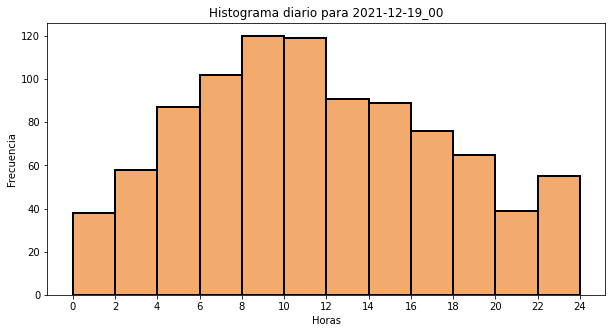

In [23]:
marks = np.array(horas)
intervalos = range(0,26,2)
fig, axis = plt.subplots(figsize =(10, 5))
axis.hist(x=marks, bins = intervalos, align='mid', color='#F2AB6D', edgecolor='black', linewidth=2)

plt.title('Histograma diario para %s'%(filename[11:-3]))
plt.xlabel('Horas')
plt.ylabel('Frecuencia')
plt.xticks(intervalos)

plt.show()
